# Performing landscape level predictions

Mount drive, install package


In [ ]:
import rasterio
###
site_path = "large_files/"

img_path = site_path + "converted_image.tif"
#img_path = site_path + "/rgb/2016/Paracou_RGB_2016_10cm.tif"
tiles_path = site_path + "tilestest/"
#model_path = "/content/drive/Shareddrives/detectree2/models/220629_ParacouSepilokDanum_JB.pth"

# Read in the tiff file
data = rasterio.open(img_path)

: 

## Tiling
Tile up the entire orthomosaic to make predictions

In [2]:
from detectree2.preprocessing.tiling import tile_data
buffer = 35
tile_width = 40
tile_height = 40
tile_data(img_path, tiles_path, buffer, tile_width, tile_height, dtype_bool = True)

  0%|          | 0/24 [00:00<?, ?it/s]

INFO:detectree2.preprocessing.tiling:Tiling complete


## Create full site predictions

### Access pre-trained model

Download pre-trained model

There might be a cleaner way to do it with `pkg_resources` but I haven't figured this out yet

In [3]:
from detectree2.models.train import MyTrainer, setup_cfg

# pretrained model?
#trained_model = "/content/drive/Shareddrives/detectree2/models/220629_ParacouSepilokDanum_JB.pth"
#trained_model = "/content/drive/Shareddrives/detectree2/models/220723_withParacouUAV.pth"
#trained_model = "/content/drive/Shareddrives/detectree2/models/230103_resize_full/model_4.pth"
# trained_model = "large_files/230103_randresize_full.pth"
trained_model = "large_files/urban_trees_Cambridge_20230630.pth"

cfg = setup_cfg(update_model=trained_model) # update_model arg can be used to load in trained  model

Make predictions!

In [4]:
# from detectree2.models.predict import predict_on_data
# from detectron2.engine import DefaultPredictor
# #cfg.MODEL.DEVICE='cpu'
# predict_on_data(directory=tiles_path, predictor=DefaultPredictor(cfg))
from detectree2.models.predict import predict_on_data
from detectron2.engine import DefaultPredictor
#cfg.MODEL.DEVICE='cpu'
predict_on_data(directory=tiles_path, predictor=DefaultPredictor(cfg))


INFO:detectron2.checkpoint.detection_checkpoint:[DetectionCheckpointer] Loading from large_files/urban_trees_Cambridge_20230630.pth ...
INFO:fvcore.common.checkpoint:[Checkpointer] Loading from large_files/urban_trees_Cambridge_20230630.pth ...


Predicting 24 files in mode rgb


/home/gaurav/anaconda3/envs/drone-monitoring/lib/python3.10/site-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Here we reproject predictions into geographical space

In [5]:
# from detectree2.models.outputs import project_to_geojson
# project_to_geojson(tiles_path, tiles_path + "predictions/", tiles_path + "predictions_geo/")
from detectree2.models.outputs import project_to_geojson
project_to_geojson(tiles_path, tiles_path + "predictions/", tiles_path + "predictions_geo/")

Projecting 24 files


Combine predictions into full output

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
from detectree2.models.outputs import stitch_crowns, clean_crowns
#name = "Paracou"
folder = tiles_path+ "/predictions_geo"
crowns9 = stitch_crowns(folder, 1)

Remove invalid geometries before cleaning. Might be a way to fix them rather than remove all together but I think the ones with invalid geometries tend to be bad crowns anyway.

In [8]:
#crowns = stitch_crowns(folder, 1)
crowns9 = crowns9[crowns9.is_valid]
# Simplify crowns to help with editing
crowns9 = crowns9.set_geometry(crowns9.simplify(0.3))
crowns9

,Confidence_score,geometry
0,0.853276,"POLYGON ((500013.55 2599959.45, 500012.35 2599..."
1,0.797703,"POLYGON ((500071.25 2599862.55, 500067.95 2599..."
2,0.651331,"POLYGON ((500103.85 2599867.75, 500101.15 2599..."
3,0.637839,"POLYGON ((500046.75 2599945.25, 500045.85 2599..."
4,0.616514,"POLYGON ((500038.65 2599929.45, 500035.25 2599..."
...,...,...
1831,0.093572,"POLYGON ((500224.35 2599917.35, 500222.15 2599..."
1832,0.092005,"POLYGON ((500232.45 2599893.15, 500226.15 2599..."
1833,0.091895,"POLYGON ((500238.25 2599959.85, 500234.85 2599..."
1834,0.091001,"POLYGON ((500190.05 2599917.15, 500188.15 2599..."


Clean overlapping crowns. For significant overlaps, the most confident crown is selected. IoU can be varied based on how strict you want the filtering to be.

In [9]:
crowns9 = clean_crowns(crowns9, 0.7, 0.5)

Cleaning 1828 crowns
0 / 1828 crowns cleaned
1000 / 1828 crowns cleaned


In [10]:
import os
os.makedirs("tiles", exist_ok=True)

crowns9.to_file("tiles/crowns9_map.gpkg")

In [ ]:
!zip tiles.zip -r tiles/

  adding: tiles/ (stored 0%)
  adding: tiles/crowns_map.gpkg (deflated 71%)
  adding: tiles/odm_orthophoto_714284_3159599_45_20_32643.tif (deflated 14%)
  adding: tiles/odm_orthophoto_714374_3159644_45_20_32643.tif (deflated 17%)
  adding: tiles/odm_orthophoto_714374_3159599_45_20_32643.png (deflated 2%)
  adding: tiles/odm_orthophoto_714419_3159644_45_20_32643.png (deflated 2%)
  adding: tiles/odm_orthophoto_714329_3159599_45_20_32643.tif (deflated 14%)
  adding: tiles/odm_orthophoto_714329_3159509_45_20_32643.tif (deflated 13%)
  adding: tiles/odm_orthophoto_714374_3159554_45_20_32643.png (deflated 1%)
  adding: tiles/odm_orthophoto_714329_3159554_45_20_32643.tif (deflated 12%)
  adding: tiles/odm_orthophoto_714419_3159599_45_20_32643.tif (deflated 14%)
  adding: tiles/odm_orthophoto_714374_3159599_45_20_32643.tif (deflated 16%)
  adding: tiles/predictions/ (stored 0%)
  adding: tiles/predictions/Prediction_odm_orthophoto_714374_3159599_45_20_32643.json (deflated 70%)
  adding: tiles

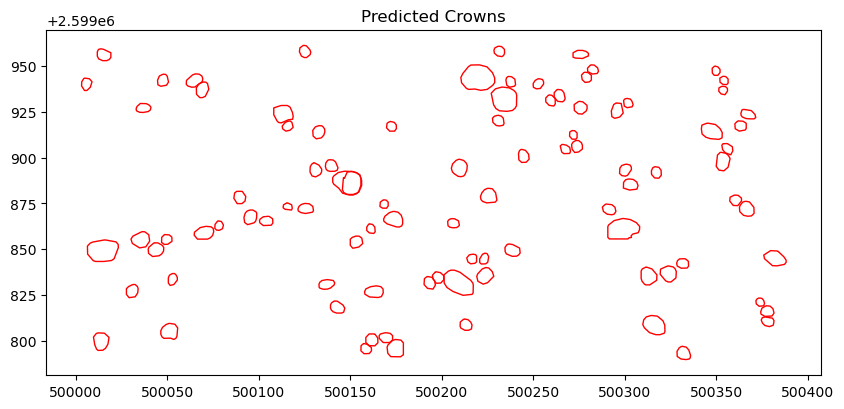

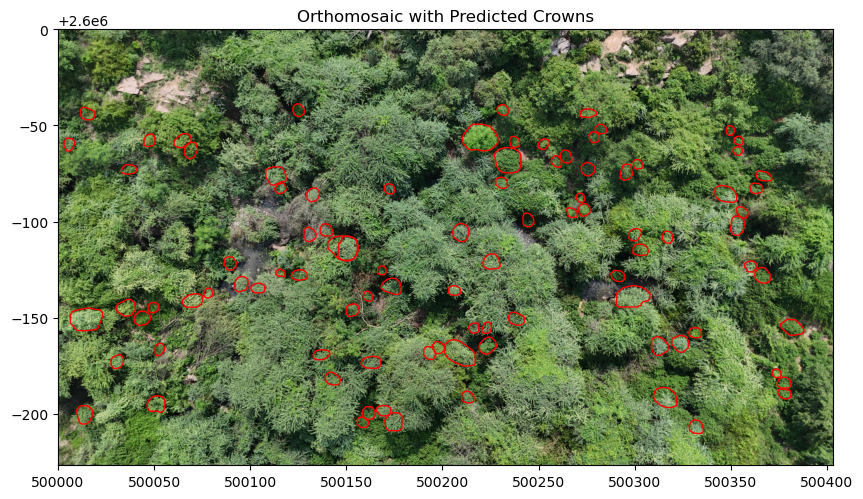

In [11]:
import matplotlib.pyplot as plt
import geopandas as gpd
import rasterio
from rasterio.plot import show

# Assuming crowns is your GeoDataFrame with predicted crown geometries
# If you want to see just the crowns:
fig, ax = plt.subplots(figsize=(10, 10))
crowns9.plot(ax=ax, facecolor='none', edgecolor='red')
ax.set_title("Predicted Crowns")
plt.show()

# Alternatively, if you'd like to overlay the crowns on the original image:
# Open the original orthomosaic image using rasterio
img_path = site_path + "converted_image.tif"
with rasterio.open(img_path) as src:
    fig, ax = plt.subplots(figsize=(10, 10))
    show(src, ax=ax)
    crowns9.plot(ax=ax, facecolor='none', edgecolor='red')
    ax.set_title("Orthomosaic with Predicted Crowns")
    plt.show()


In [12]:
import matplotlib.pyplot as plt
import geopandas as gpd
import rasterio
from rasterio.plot import show

# Define output path
output_path = "overlaid_crowns.png"  # or .jpg

# Load your image
img_path = site_path + "converted_image.tif"
with rasterio.open(img_path) as src:
    fig, ax = plt.subplots(figsize=(10, 10))
    show(src, ax=ax)
    crowns9.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1)
    ax.set_title("Orthomosaic with Predicted Crowns")
    plt.axis('off')
    
    # Save figure
    plt.savefig(output_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.close(fig)

print(f"✅ Saved overlaid image to: {output_path}")


✅ Saved overlaid image to: overlaid_crowns.png


OM2: | 0.02, 0.00, 714261.73|
| 0.00,-0.02, 3159731.32|
| 0.00, 0.00, 1.00|
OM1: | 0.02, 0.00, 714257.62|
| 0.00,-0.02, 3159734.16|
| 0.00, 0.00, 1.00|
EPSG:32643
EPSG:32643


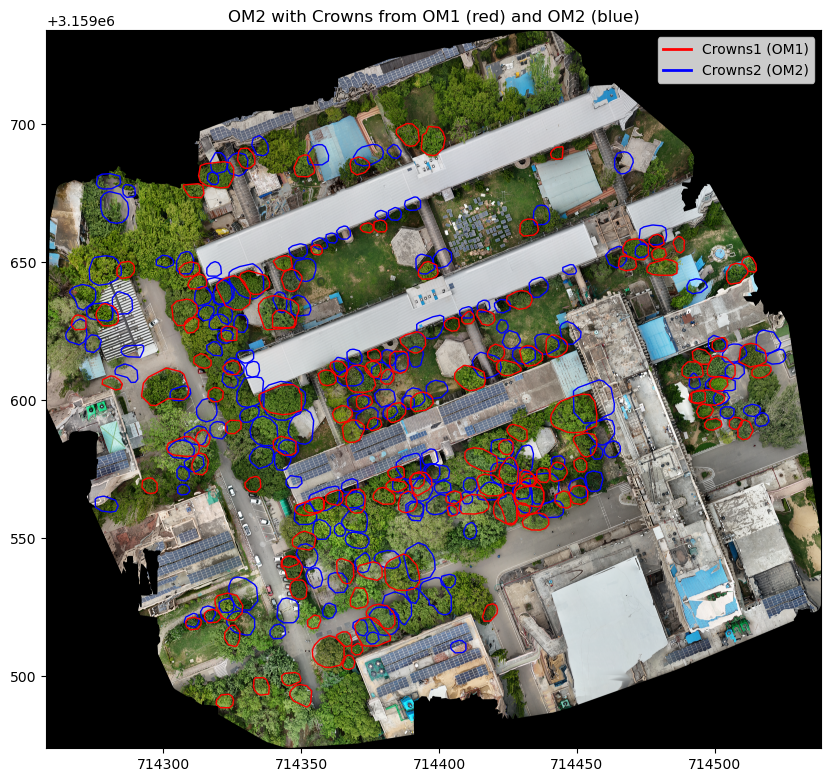

In [3]:
import os
import matplotlib.pyplot as plt
import geopandas as gpd
import rasterio
from rasterio.plot import show

# Load saved crown predictions
crowns1 = gpd.read_file("tiles/crowns6_map.gpkg")
crowns2 = gpd.read_file("tiles/crowns7_map.gpkg")

# Path to orthomosaic image (OM2)
img_path = site_path + "sit_om6.tif"
img_path2 = site_path + "sit_om4.tif"

# Plot the orthomosaic and overlay both sets of predictions
with rasterio.open(img_path2) as src1:
    print("OM2:", src1.transform)
with rasterio.open(img_path) as src:
    fig, ax = plt.subplots(figsize=(10, 10))

    # Show orthomosaic
    show(src, ax=ax)
    raster_crs = src.crs

    # Reproject crowns to match the raster CRS
    if crowns2.crs != raster_crs:
        crowns2 = crowns2.to_crs(raster_crs)
    if crowns1.crs != raster_crs:
        crowns1 = crowns1.to_crs(raster_crs)
    print("OM1:", src.transform)

    
    print(crowns1.crs)
    print(crowns2.crs)
     # Overlay crowns2 (from OM2) in blue
    crowns2.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, label='Crowns2 (OM2)')
    # Overlay crowns1 (from OM1) in red
    crowns1.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='Crowns1 (OM1)')

   

    ax.set_title("OM2 with Crowns from OM1 (red) and OM2 (blue)")
    plt.legend(handles=[
        plt.Line2D([0], [0], color='red', label='Crowns1 (OM1)', linewidth=2),
        plt.Line2D([0], [0], color='blue', label='Crowns2 (OM2)', linewidth=2)
    ])
    plt.show()

Median shifting

Applying median translation: dx = 3.21, dy = -1.00


/tmp/ipykernel_222816/948902018.py:71: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
/tmp/ipykernel_222816/948902018.py:71: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


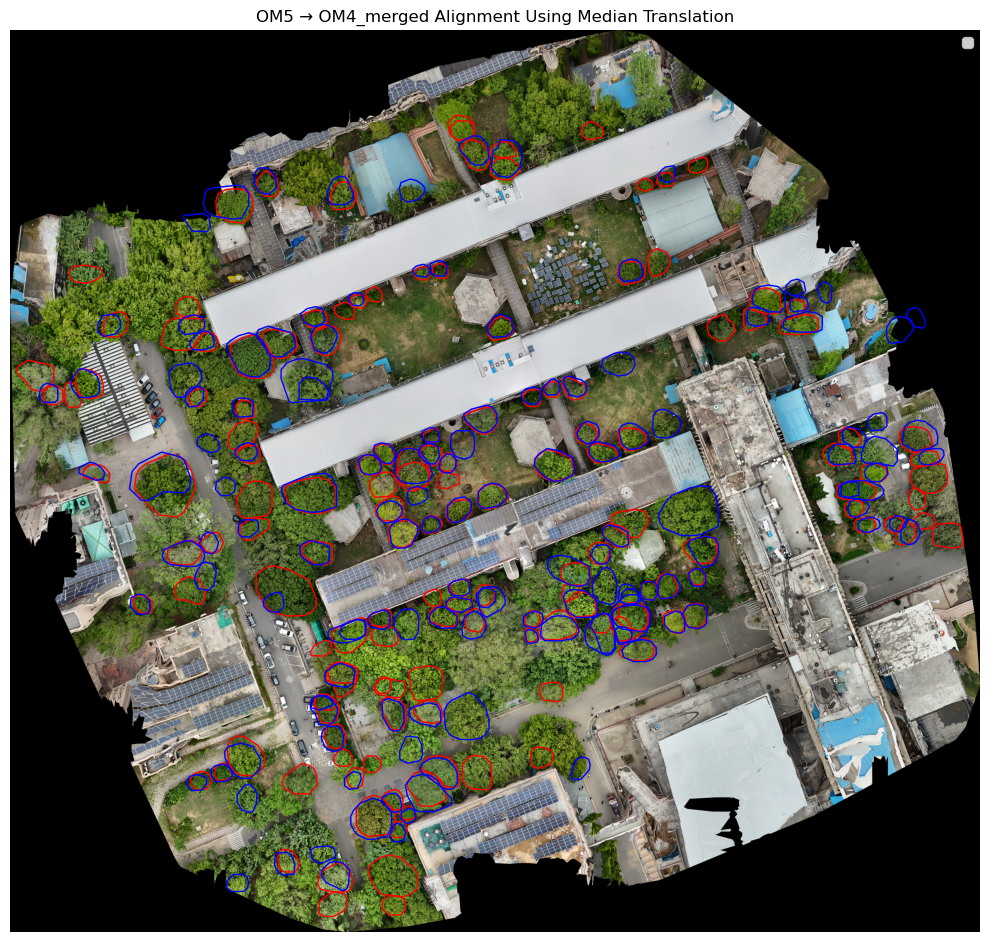

IoU between OM4_merged crown 35 and OM5 crown 129: 0.0000 (0.00%)


In [19]:
import geopandas as gpd
import numpy as np
from shapely.affinity import translate
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show

# --- Load Data ---
site_path = "large_files/"
img_path_om3 = site_path + "sit_om5.tif"
crowns_om3 = gpd.read_file("tiles/crowns5_map.gpkg")  # reference crowns (OM3)
crowns_om4 = gpd.read_file("tiles/crowns6_map.gpkg")  # shifted crowns (OM4)

# --- Match CRS ---
with rasterio.open(img_path_om3) as src:
    crs_target = src.crs

crowns_om3 = crowns_om3.to_crs(crs_target)
crowns_om4 = crowns_om4.to_crs(crs_target)

# --- Get Centroids ---
centroids_om3 = np.array([[geom.centroid.x, geom.centroid.y] for geom in crowns_om3.geometry])
centroids_om4 = np.array([[geom.centroid.x, geom.centroid.y] for geom in crowns_om4.geometry])

# --- Nearest Neighbor Matching ---
nn = NearestNeighbors(n_neighbors=1).fit(centroids_om3)  # OM3 = reference
distances, indices = nn.kneighbors(centroids_om4)

threshold = 10  # meters
matched = [(indices[i][0], i) for i in range(len(distances)) if distances[i][0] < threshold]


if len(matched) < 3:
    raise ValueError("Not enough matched crowns found for reliable alignment.")

# --- Compute Median Translation Vector from Matched Pairs ---
shifts = []
for i_om3, i_om4 in matched:
    p = centroids_om3[i_om3]
    q = centroids_om4[i_om4]
    dx, dy = p - q
    shifts.append((dx, dy))


shifts = np.array(shifts)
# Optional filtering step before computing the median shift
residuals = np.linalg.norm(shifts, axis=1)
inliers = residuals < np.percentile(residuals, 90)  # Keep top 90% closest
dx, dy = np.median(shifts[inliers], axis=0)
#------initially i was getting 80.34%IOU when above 3 lines were Not used and below line was used------------
# dx, dy = np.median(shifts, axis=0)  # Robust translation 

print(f"Applying median translation: dx = {dx:.2f}, dy = {dy:.2f}")

# --- Apply Global Translation ---
crowns_om4['geometry'] = crowns_om4['geometry'].apply(lambda g: translate(g, xoff=dx, yoff=dy))

# --- Save Aligned OM3 ---
crowns_om4.to_file("tiles/crowns6_aligned.gpkg", driver="GPKG")

# --- Plotting ---
fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open(img_path_om3) as src:
    show(src, ax=ax)

crowns_om3.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='OM3 aligned')
crowns_om4.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, label='OM4 reference')

ax.set_title("OM5 → OM4_merged Alignment Using Median Translation")
plt.legend()
plt.axis('off')
plt.tight_layout()
plt.show()

# --- IoU Evaluation for Specific Crowns ---
id_om3, id_om4 = 35, 129
if id_om3 < len(crowns_om3) and id_om4 < len(crowns_om4):
    g1 = crowns_om3.loc[id_om3].geometry
    g2 = crowns_om4.loc[id_om4].geometry
    inter = g1.intersection(g2).area
    union = g1.union(g2).area
    iou = inter / union if union > 0 else 0
    print(f"IoU between OM4_merged crown {id_om3} and OM5 crown {id_om4}: {iou:.4f} ({iou*100:.2f}%)")
else:
    print("Invalid crown indices for IoU check.")


Applying median translation: dx = -0.00, dy = -0.00


/tmp/ipykernel_222816/1736187811.py:82: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
/tmp/ipykernel_222816/1736187811.py:82: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


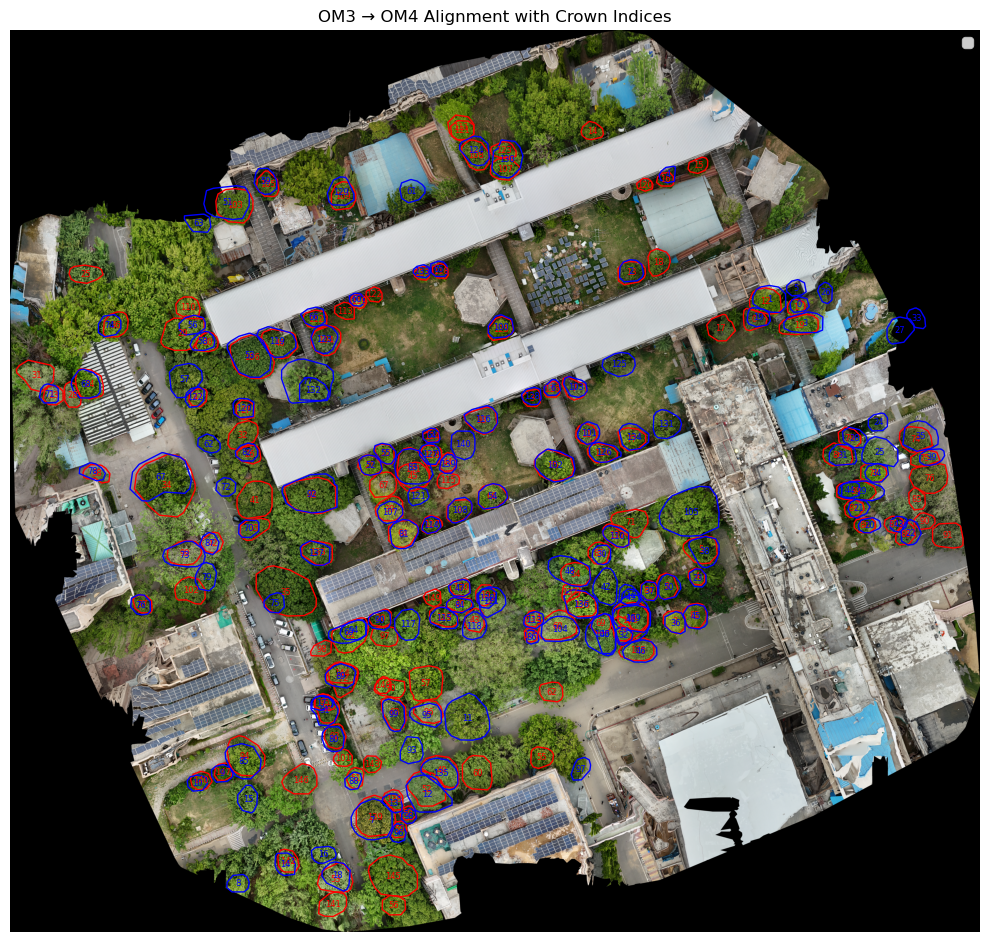

IoU between OM3 crown 36 and OM4 crown 139: 0.0000 (0.00%)


In [21]:
import geopandas as gpd
import numpy as np
from shapely.affinity import translate
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show

# --- Load Data ---
site_path = "large_files/"
img_path_om3 = site_path + "sit_om5.tif"
crowns_om3 = gpd.read_file("tiles/crowns5_map.gpkg")  # reference crowns (OM3)
crowns_om4 = gpd.read_file("tiles/crowns6_aligned.gpkg")  # shifted crowns (OM4)

# --- Match CRS ---
with rasterio.open(img_path_om3) as src:
    crs_target = src.crs

crowns_om3 = crowns_om3.to_crs(crs_target)
crowns_om4 = crowns_om4.to_crs(crs_target)

# --- Get Centroids ---
centroids_om3 = np.array([[geom.centroid.x, geom.centroid.y] for geom in crowns_om3.geometry])
centroids_om4 = np.array([[geom.centroid.x, geom.centroid.y] for geom in crowns_om4.geometry])

# --- Nearest Neighbor Matching ---
nn = NearestNeighbors(n_neighbors=1).fit(centroids_om3)  # OM3 = reference
distances, indices = nn.kneighbors(centroids_om4)

threshold = 10  # meters
matched = [(indices[i][0], i) for i in range(len(distances)) if distances[i][0] < threshold]


if len(matched) < 3:
    raise ValueError("Not enough matched crowns found for reliable alignment.")

# --- Compute Median Translation Vector from Matched Pairs ---
shifts = []
for i_om3, i_om4 in matched:
    p = centroids_om3[i_om3]
    q = centroids_om4[i_om4]
    dx, dy = p - q
    shifts.append((dx, dy))


shifts = np.array(shifts)
# Optional filtering step before computing the median shift
residuals = np.linalg.norm(shifts, axis=1)
inliers = residuals < np.percentile(residuals, 90)  # Keep top 90% closest
dx, dy = np.median(shifts[inliers], axis=0)
#------initially i was getting 80.34%IOU when above 3 lines were Not used and below line was used------------
# dx, dy = np.median(shifts, axis=0)  # Robust translation 

print(f"Applying median translation: dx = {dx:.2f}, dy = {dy:.2f}")

# --- Apply Global Translation ---
crowns_om4['geometry'] = crowns_om4['geometry'].apply(lambda g: translate(g, xoff=dx, yoff=dy))

# --- Save Aligned OM3 ---
crowns_om4.to_file("tiles/crowns6_aligned.gpkg", driver="GPKG")
# --- Plotting ---
fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open(img_path_om3) as src:
    show(src, ax=ax)

# Plot the crowns
crowns_om3.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='OM3 aligned')
crowns_om4.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, label='OM4 reference')

# Annotate OM3 crowns
for idx, row in crowns_om3.iterrows():
    x, y = row.geometry.centroid.coords[0]
    ax.annotate(str(idx), (x, y), color='red', fontsize=6, ha='center', va='center')

# Annotate OM4 crowns
for idx, row in crowns_om4.iterrows():
    x, y = row.geometry.centroid.coords[0]
    ax.annotate(str(idx), (x, y), color='blue', fontsize=6, ha='center', va='center')

# Final touches
ax.set_title("OM3 → OM4 Alignment with Crown Indices")
plt.legend()
plt.axis('off')
plt.tight_layout()
plt.show()


# --- IoU Evaluation for Specific Crowns ---
id_om3, id_om4 = 36, 139
if id_om3 < len(crowns_om3) and id_om4 < len(crowns_om4):
    g1 = crowns_om3.loc[id_om3].geometry
    g2 = crowns_om4.loc[id_om4].geometry
    inter = g1.intersection(g2).area
    union = g1.union(g2).area
    iou = inter / union if union > 0 else 0
    print(f"IoU between OM3 crown {id_om3} and OM4 crown {id_om4}: {iou:.4f} ({iou*100:.2f}%)")
else:
    print("Invalid crown indices for IoU check.")


create crowns with 0 IOU 

/tmp/ipykernel_222816/2978144449.py:58: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
/tmp/ipykernel_222816/2978144449.py:58: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


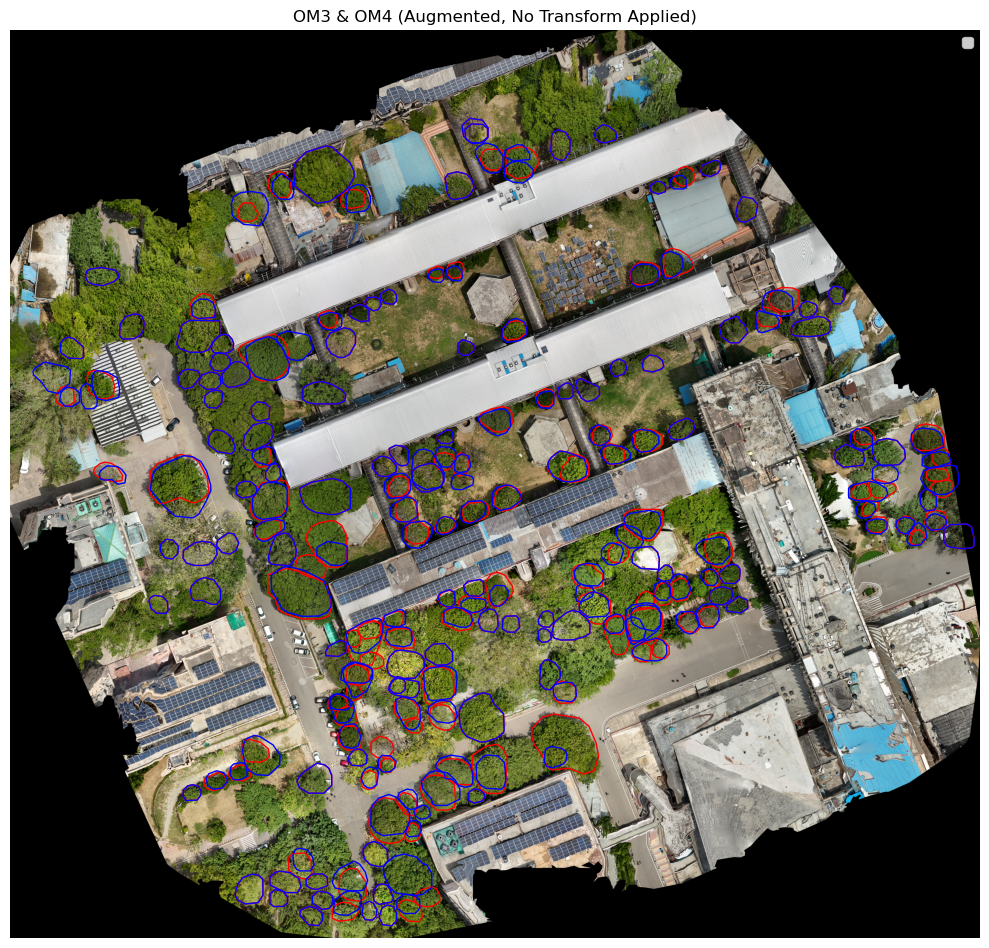

In [16]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
from sklearn.neighbors import NearestNeighbors
import pandas as pd

# --- Load data ---
site_path = "large_files/"
img_path_om3 = site_path + "sit_om4.tif"
crowns_om4 = gpd.read_file("tiles/crowns5_aligned.gpkg")
crowns_om3 = gpd.read_file("tiles/crowns4_map.gpkg")

# --- Match CRS ---
with rasterio.open(img_path_om3) as src:
    crs_target = src.crs

crowns_om3 = crowns_om3.to_crs(crs_target)
crowns_om4 = crowns_om4.to_crs(crs_target)

# --- IoU function ---
def compute_iou(g1, g2):
    inter = g1.intersection(g2).area
    union = g1.union(g2).area
    return inter / union if union > 0 else 0.0

# --- Augment OM3 and OM4 without any affine transform ---
augmented_om3 = crowns_om3.copy()
augmented_om4 = crowns_om4.copy()

# Add OM3 crowns to OM4 if missing (no transform needed)
for idx, row in crowns_om3.iterrows():
    if all(compute_iou(row.geometry, g2) < 0.01 for g2 in crowns_om4.geometry):
        new_row = row.copy()
        new_row['origin'] = 'from_om3'
        augmented_om4 = pd.concat([augmented_om4, gpd.GeoDataFrame([new_row], crs=augmented_om4.crs)], ignore_index=True)

# Add OM4 crowns to OM3 if missing (no transform needed)
for idx, row in crowns_om4.iterrows():
    if all(compute_iou(row.geometry, g2) < 0.01 for g2 in crowns_om3.geometry):
        new_row = row.copy()
        new_row['origin'] = 'from_om4'
        augmented_om3 = pd.concat([augmented_om3, gpd.GeoDataFrame([new_row], crs=augmented_om3.crs)], ignore_index=True)

# --- Save updated GeoPackages ---
augmented_om3.to_file("tiles/crowns4_5_augmented.gpkg", driver="GPKG")
augmented_om4.to_file("tiles/crowns5_augmented.gpkg", driver="GPKG")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open(img_path_om3) as src:
    show(src, ax=ax)

augmented_om3.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='OM3')
augmented_om4.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, label='OM4')
ax.set_title("OM3 & OM4 (Augmented, No Transform Applied)")
plt.legend()
plt.axis('off')
plt.tight_layout()
plt.show()


In [44]:
# import geopandas as gpd
# import numpy as np
# import matplotlib.pyplot as plt
# import rasterio
# from rasterio.plot import show
# from sklearn.neighbors import NearestNeighbors
# import pandas as pd

# # --- Load data ---
# site_path = "large_files/"
# img_path_om4 = site_path + "sit_om4.tif"
# crowns_om3 = gpd.read_file("tiles/crowns3_aligned.gpkg")
# crowns_om4 = gpd.read_file("tiles/crowns4_map.gpkg")

# # --- Match CRS ---
# with rasterio.open(img_path_om4) as src:
#     crs_target = src.crs

# crowns_om3 = crowns_om3.to_crs(crs_target)
# crowns_om4 = crowns_om4.to_crs(crs_target)

# # --- IoU function ---
# def compute_iou(g1, g2):
#     inter = g1.intersection(g2).area
#     union = g1.union(g2).area
#     return inter / union if union > 0 else 0.0

# # --- Augment OM3 and OM4 without any affine transform ---
# augmented_om3 = crowns_om3.copy()
# augmented_om4 = crowns_om4.copy()

# # Add OM3 crowns to OM4 if missing (no transform needed)
# for idx, row in crowns_om3.iterrows():
#     if all(compute_iou(row.geometry, g2) < 0.01 for g2 in crowns_om4.geometry):
#         new_row = row.copy()
#         new_row['origin'] = 'from_om3'
#         augmented_om4 = pd.concat([augmented_om4, gpd.GeoDataFrame([new_row], crs=augmented_om4.crs)], ignore_index=True)

# # Add OM4 crowns to OM3 if missing (no transform needed)
# for idx, row in crowns_om4.iterrows():
#     if all(compute_iou(row.geometry, g2) < 0.01 for g2 in crowns_om3.geometry):
#         new_row = row.copy()
#         new_row['origin'] = 'from_om4'
#         augmented_om3 = pd.concat([augmented_om3, gpd.GeoDataFrame([new_row], crs=augmented_om3.crs)], ignore_index=True)

# # --- Save updated GeoPackages ---
# augmented_om3.to_file("tiles/crowns3_augmented.gpkg", driver="GPKG")
# augmented_om4.to_file("tiles/crowns4_augmented.gpkg", driver="GPKG")

# # --- Plot ---
# fig, ax = plt.subplots(figsize=(10, 10))
# with rasterio.open(img_path_om4) as src:
#     show(src, ax=ax)

# augmented_om3.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='OM3')
# augmented_om4.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, label='OM4')
# ax.set_title("OM3 & OM4 (Augmented, No Transform Applied)")
# plt.legend()
# plt.axis('off')
# plt.tight_layout()
# plt.show()

In [11]:

# import geopandas as gpd
# import numpy as np
# import pandas as pd
# from shapely.affinity import affine_transform
# from shapely.ops import unary_union
# from sklearn.neighbors import NearestNeighbors
# import matplotlib.pyplot as plt
# import rasterio
# from rasterio.plot import show

# # --- Load Data ---
# site_path = "large_files/"
# img_path_om3 = site_path + "sit_om3.tif"
# crowns_om3 = gpd.read_file("tiles/crowns3_augmented.gpkg")  # Shifted crowns (OM3)
# crowns_om4 = gpd.read_file("tiles/crowns4_augmented.gpkg")  # Reference crowns (OM4)

# # --- Match CRS ---
# with rasterio.open(img_path_om3) as src:
#     crs_target = src.crs

# crowns_om3 = crowns_om3.to_crs(crs_target)
# crowns_om4 = crowns_om4.to_crs(crs_target)

# # --- Get Centroids ---
# centroids_om3 = np.array([[geom.centroid.x, geom.centroid.y] for geom in crowns_om3.geometry])
# centroids_om4 = np.array([[geom.centroid.x, geom.centroid.y] for geom in crowns_om4.geometry])

# # --- Nearest Neighbors Matching ---
# nn = NearestNeighbors(n_neighbors=1).fit(centroids_om3)
# distances, indices = nn.kneighbors(centroids_om4)

# threshold = 10  # meters
# matched = [(i, indices[i][0]) for i in range(len(distances)) if distances[i][0] < threshold]
# if len(matched) < 3:
#     raise ValueError("Not enough matched crowns found for alignment.")

# # --- Compute Affine Transformation OM3 → OM4 ---
# def compute_affine(P, Q):
#     P_mean = P.mean(axis=0)
#     Q_mean = Q.mean(axis=0)
#     P_centered = P - P_mean
#     Q_centered = Q - Q_mean
#     U, _, Vt = np.linalg.svd(P_centered.T @ Q_centered)
#     R = U @ Vt
#     s = np.linalg.norm(Q_centered) / np.linalg.norm(P_centered)
#     t = Q_mean - s * R @ P_mean
#     return R, t, s

# P = np.array([centroids_om4[i] for i, _ in matched])  # OM4 (to align)
# Q = np.array([centroids_om3[j] for _, j in matched])  # OM3 (reference)

# R, t, s = compute_affine(P, Q)

# # Convert to Shapely affine matrix
# a, b = s * R[0, 0], s * R[0, 1]
# d, e = s * R[1, 0], s * R[1, 1]
# xoff, yoff = t
# affine_mat = [a, b, d, e, xoff, yoff]

# # --- Apply Affine to OM4 Crowns ---
# crowns_om4['geometry'] = crowns_om4['geometry'].apply(lambda g: affine_transform(g, affine_mat))

# # --- IoU Function ---
# def compute_iou(g1, g2):
#     inter = g1.intersection(g2).area
#     union = g1.union(g2).area
#     return inter / union if union > 0 else 0.0

# # --- Build IoU Matrix ---
# iou_matrix = np.zeros((len(crowns_om3), len(crowns_om4)))
# for i, g3 in enumerate(crowns_om3.geometry):
#     for j, g4 in enumerate(crowns_om4.geometry):
#         iou_matrix[i, j] = compute_iou(g3, g4)

# # --- Merge crowns with IoU > threshold(currently 0.7) ---
# merged_geoms = []

# merged_om3 = crowns_om3.copy()
# merged_om4 = crowns_om4.copy()

# high_iou_pairs = []

# for i in range(len(crowns_om3)):
#     for j in range(len(crowns_om4)):
#         if iou_matrix[i, j] > 0.70:
#             # Merge and store in list
#             merged_geom = crowns_om3.geometry.iloc[i].union(crowns_om4.geometry.iloc[j])
#             merged_geoms.append((i, j, merged_geom))
#             high_iou_pairs.append((i, j))

# # Replace matched geometries in both GeoDataFrames with the unioned geometry
# for i, j, merged_geom in merged_geoms:
#     merged_om3.at[i, 'geometry'] = merged_geom
#     merged_om4.at[j, 'geometry'] = merged_geom

# # Overwrite original variables with updated merged geometries
# crowns_om3 = merged_om3
# crowns_om4 = merged_om4


# # --- Compute A−B and B−A Differences ---
# iou_threshold = 0.1
# ab_diffs = []
# ba_diffs = []


# q = 50.0  # Area threshold in m² to ignore small slivers

# for i, geom3 in enumerate(crowns_om3.geometry):
#     overlapping_om4 = [j for j in range(len(crowns_om4)) if iou_matrix[i, j] > iou_threshold]
#     if overlapping_om4:
#         union_om4 = crowns_om4.geometry.iloc[overlapping_om4].unary_union
#         if geom3.area >= union_om4.area:
#             diff_geom = geom3.difference(union_om4)
#             if not diff_geom.is_empty and diff_geom.area >= q:
#                 ab_diffs.append(diff_geom)
#         else:
#             diff_geom = union_om4.difference(geom3)
#             if not diff_geom.is_empty and diff_geom.area >= q:
#                 ba_diffs.append(diff_geom)


# # --- Plotting ---
# fig, ax = plt.subplots(figsize=(10, 10))
# with rasterio.open(img_path_om4) as src:
#     show(src, ax=ax)

# # Outline crowns
# crowns_om3.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='OM3 aligned')
# crowns_om4.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, label='OM4 reference')

# # Plot A−B (yellow) and B−A (purple)
# gpd.GeoSeries(ab_diffs, crs=crs_target).plot(ax=ax, facecolor='yellow', edgecolor='black', linewidth=0.8, label='OM3 - OM4')
# gpd.GeoSeries(ba_diffs, crs=crs_target).plot(ax=ax, facecolor='purple', edgecolor='black', linewidth=0.8, label='OM4 - OM3')

# # Final touches
# ax.set_title("Only A−B and B−A Filled | Aligned Crowns Outlined")
# plt.legend()
# plt.axis('off')
# plt.tight_layout()
# plt.show()

merging high iou crowns and making A-B and B-A with condition

/tmp/ipykernel_43795/616292717.py:62: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  union_om4 = crowns_om4.geometry.iloc[overlapping_om4].unary_union
/tmp/ipykernel_43795/616292717.py:82: UserWarning: The GeoSeries you are attempting to plot is empty. Nothing has been displayed.
  gpd.GeoSeries(ab_diffs, crs=crs_target).plot(ax=ax, facecolor='yellow', edgecolor='black', linewidth=0.8, label='OM3 - OM4')
/tmp/ipykernel_43795/616292717.py:86: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
/tmp/ipykernel_43795/616292717.py:86: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


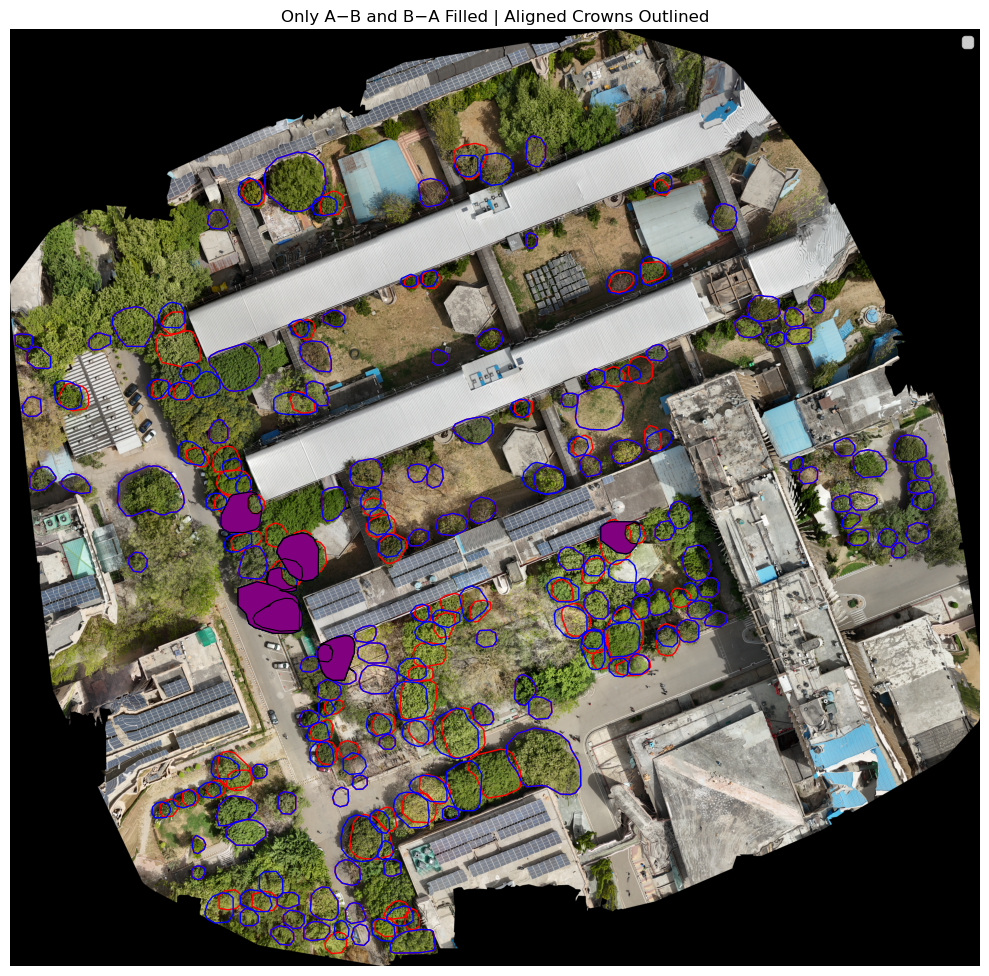

In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
from shapely.ops import unary_union
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show

# --- Load Data ---
site_path = "large_files/"
img_path_om3 = site_path + "sit_om5.tif"
crowns_om3 = gpd.read_file("tiles/crowns5_6_augmented.gpkg")  # Reference crowns (OM3)
crowns_om4 = gpd.read_file("tiles/crowns6_augmented.gpkg")  # Aligned crowns (OM4)

# --- Match CRS ---
with rasterio.open(img_path_om3) as src:
    crs_target = src.crs

crowns_om3 = crowns_om3.to_crs(crs_target)
crowns_om4 = crowns_om4.to_crs(crs_target)

# --- IoU Function ---
def compute_iou(g1, g2):
    inter = g1.intersection(g2).area
    union = g1.union(g2).area
    return inter / union if union > 0 else 0.0

# --- Build IoU Matrix ---
iou_matrix = np.zeros((len(crowns_om3), len(crowns_om4)))
for i, g3 in enumerate(crowns_om3.geometry):
    for j, g4 in enumerate(crowns_om4.geometry):
        iou_matrix[i, j] = compute_iou(g3, g4)

# --- Merge crowns with IoU > threshold (e.g., 0.7) ---
merged_geoms = []
merged_om3 = crowns_om3.copy()
merged_om4 = crowns_om4.copy()

for i in range(len(crowns_om3)):
    for j in range(len(crowns_om4)):
        if iou_matrix[i, j] > 0.70:
            merged_geom = crowns_om3.geometry.iloc[i].union(crowns_om4.geometry.iloc[j])
            merged_geoms.append((i, j, merged_geom))

for i, j, merged_geom in merged_geoms:
    merged_om3.at[i, 'geometry'] = merged_geom
    merged_om4.at[j, 'geometry'] = merged_geom

crowns_om3 = merged_om3
crowns_om4 = merged_om4

# --- Compute A−B and B−A Differences ---
iou_threshold = 0.1
ab_diffs = []
ba_diffs = []

q = 50.0  # Area threshold to ignore small slivers

for i, geom3 in enumerate(crowns_om3.geometry):
    overlapping_om4 = [j for j in range(len(crowns_om4)) if iou_matrix[i, j] > iou_threshold]
    if overlapping_om4:
        union_om4 = crowns_om4.geometry.iloc[overlapping_om4].unary_union
        if geom3.area >= union_om4.area:
            diff_geom = geom3.difference(union_om4)
            if not diff_geom.is_empty and diff_geom.area >= q:
                ab_diffs.append(diff_geom)
        else:
            diff_geom = union_om4.difference(geom3)
            if not diff_geom.is_empty and diff_geom.area >= q:
                ba_diffs.append(diff_geom)

# --- Plotting ---
fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open(img_path_om3) as src:
    show(src, ax=ax)

# Outline crowns
crowns_om3.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='OM3 (Reference)')
crowns_om4.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, label='OM4 (Aligned)')

# Plot A−B (yellow) and B−A (purple)
gpd.GeoSeries(ab_diffs, crs=crs_target).plot(ax=ax, facecolor='yellow', edgecolor='black', linewidth=0.8, label='OM3 - OM4')
gpd.GeoSeries(ba_diffs, crs=crs_target).plot(ax=ax, facecolor='purple', edgecolor='black', linewidth=0.8, label='OM4 - OM3')

ax.set_title("Only A−B and B−A Filled | Aligned Crowns Outlined")
plt.legend()
plt.axis('off')
plt.tight_layout()
plt.show()


[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.52723109 0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


/tmp/ipykernel_222816/4205637398.py:67: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  union_om4 = crowns_om4.geometry.iloc[overlapping_om4].unary_union
/tmp/ipykernel_222816/4205637398.py:108: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
/tmp/ipykernel_222816/4205637398.py:108: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


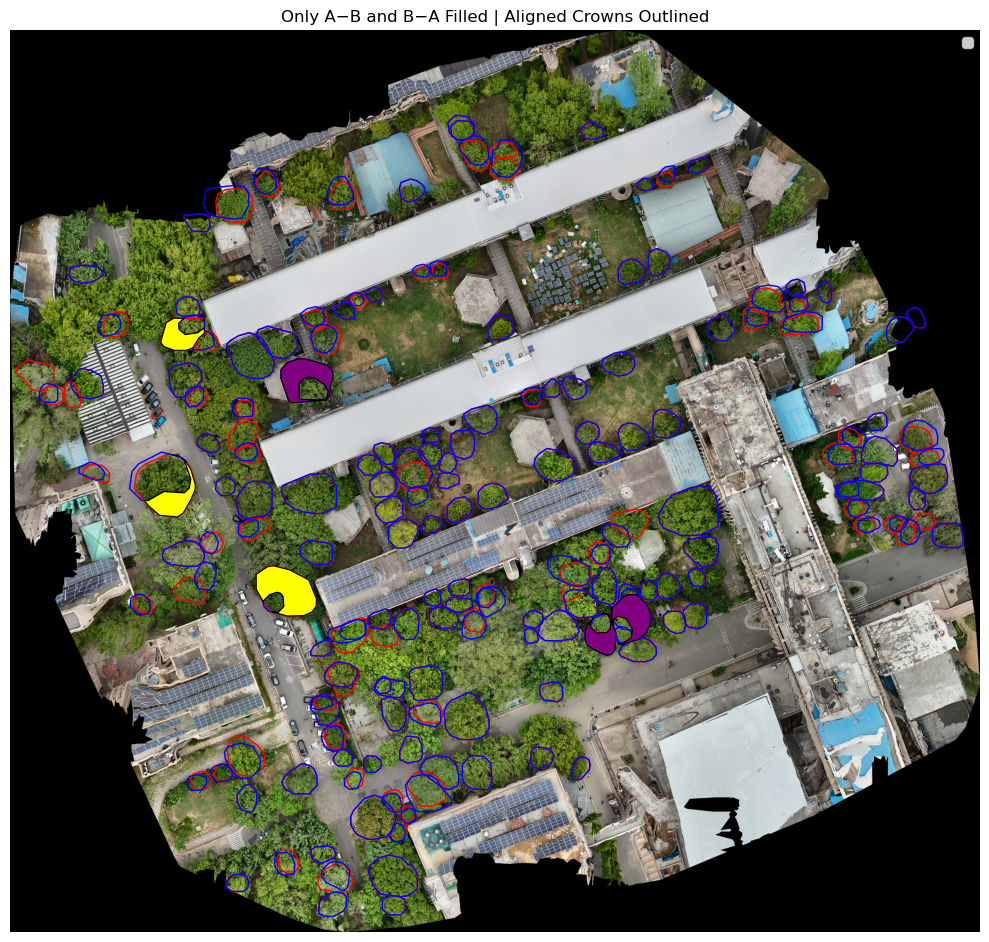

In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
from shapely.ops import unary_union
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show

# --- Load Data ---
site_path = "large_files/"
img_path_om3 = site_path + "sit_om5.tif"
crowns_om3 = gpd.read_file("tiles/crowns5_6_augmented.gpkg")  # Reference crowns (OM3)
crowns_om4 = gpd.read_file("tiles/crowns6_augmented.gpkg")  # Aligned crowns (OM4)

# --- Match CRS ---
with rasterio.open(img_path_om3) as src:
    crs_target = src.crs

crowns_om3 = crowns_om3.to_crs(crs_target)
crowns_om4 = crowns_om4.to_crs(crs_target)

# --- IoU Function ---
def compute_iou(g1, g2):
    inter = g1.intersection(g2).area
    union = g1.union(g2).area
    return inter / union if union > 0 else 0.0

# --- Build IoU Matrix ---
iou_matrix = np.zeros((len(crowns_om3), len(crowns_om4)))
for i, g3 in enumerate(crowns_om3.geometry):
    for j, g4 in enumerate(crowns_om4.geometry):
        iou_matrix[i, j] = compute_iou(g3, g4)
print(iou_matrix)
# --- Merge crowns with IoU > threshold (e.g., 0.7) ---
merged_geoms = []
merged_om3 = crowns_om3.copy()
merged_om4 = crowns_om4.copy()

for i in range(len(crowns_om3)):
    for j in range(len(crowns_om4)):
        if iou_matrix[i, j] > 0.70:
            merged_geom = crowns_om3.geometry.iloc[i].union(crowns_om4.geometry.iloc[j])
            merged_geoms.append((i, j, merged_geom))

for i, j, merged_geom in merged_geoms:
    merged_om3.at[i, 'geometry'] = merged_geom
    merged_om4.at[j, 'geometry'] = merged_geom

# Update main crown sets
crowns_om3 = merged_om3
crowns_om4 = merged_om4

# --- Save Merged Crowns ---
# crowns_om3.to_file("tiles/crowns4_5_merged.gpkg", driver="GPKG")
# crowns_om4.to_file("tiles/crowns5_merged.gpkg", driver="GPKG")

# --- Compute A−B and B−A Differences ---
iou_threshold = 0.1
ab_diffs = []
ba_diffs = []

q = 50.0 

for i, geom3 in enumerate(crowns_om3.geometry):
    overlapping_om4 = [j for j in range(len(crowns_om4)) if iou_matrix[i, j] > iou_threshold]
    if overlapping_om4:
        union_om4 = crowns_om4.geometry.iloc[overlapping_om4].unary_union
        if geom3.area >= union_om4.area:
            diff_geom = geom3.difference(union_om4)
            if not diff_geom.is_empty and diff_geom.area >= q:
                ab_diffs.append(diff_geom)
        else:
            diff_geom = union_om4.difference(geom3)
            if not diff_geom.is_empty and diff_geom.area >= q:
                ba_diffs.append(diff_geom)


# --- Append A−B and B−A to merged crowns ---
diff_geoms = ab_diffs + ba_diffs
diff_gdf = gpd.GeoDataFrame(geometry=diff_geoms, crs=crs_target)

# Combine with merged crowns
merged_all = pd.concat([crowns_om3, diff_gdf], ignore_index=True)

# Save to one file
merged_all.to_file("tiles/crowns5_6_merged.gpkg", driver="GPKG")

# Optionally save OM4 separately if needed
crowns_om4.to_file("tiles/crowns6_merged.gpkg", driver="GPKG")


# --- Plotting ---
fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open(img_path_om3) as src:
    show(src, ax=ax)

# Outline crowns
crowns_om3.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='OM3 (Reference)')
crowns_om4.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, label='OM4 (Aligned)')

# Plot A−B (yellow) and B−A (purple)
gpd.GeoSeries(ab_diffs, crs=crs_target).plot(ax=ax, facecolor='yellow', edgecolor='black', linewidth=0.8, label='OM3 - OM4')
gpd.GeoSeries(ba_diffs, crs=crs_target).plot(ax=ax, facecolor='purple', edgecolor='black', linewidth=0.8, label='OM4 - OM3')

ax.set_title("Only A−B and B−A Filled | Aligned Crowns Outlined")
plt.legend()
plt.axis('off')
plt.tight_layout()
plt.show()


Creating same crowns which have IOU=0 crowns because when crowns are merged only single crown is left that is why create duplicate

/tmp/ipykernel_226119/3862362217.py:74: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
/tmp/ipykernel_226119/3862362217.py:74: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


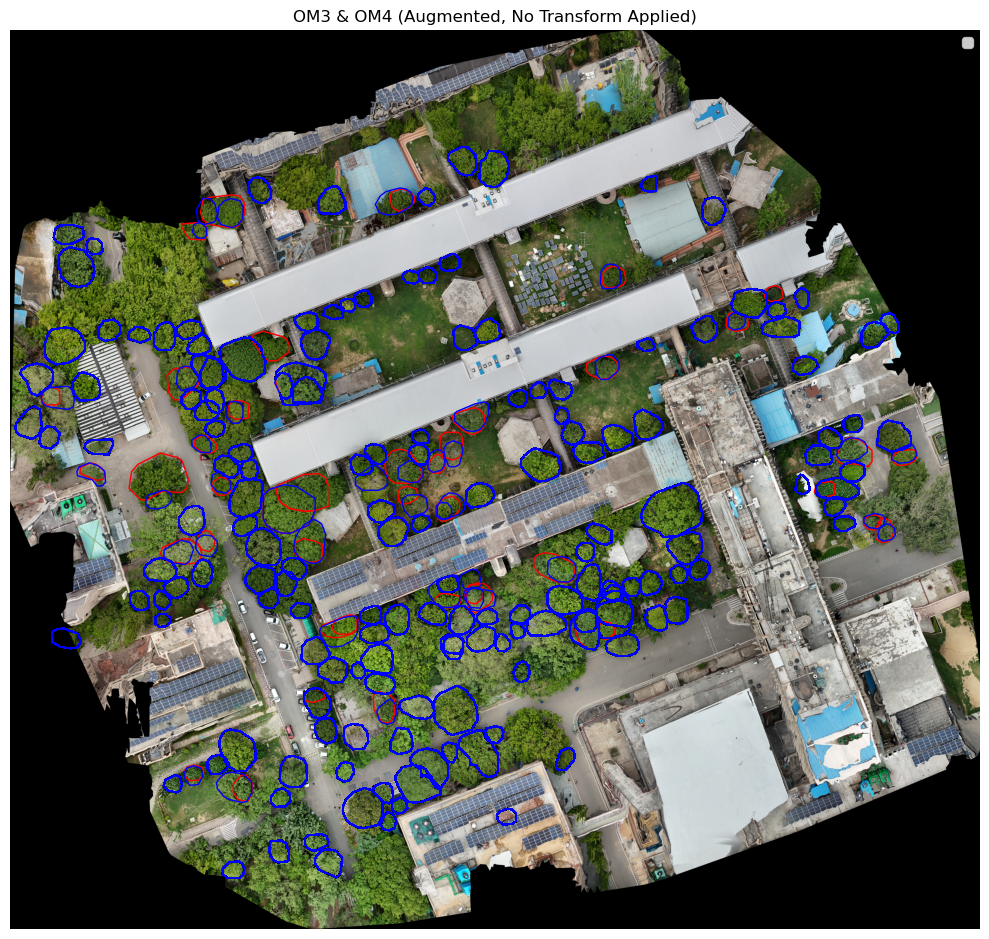

In [10]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
from sklearn.neighbors import NearestNeighbors
import pandas as pd

# --- Load data ---
site_path = "large_files/"
img_path_om3 = site_path + "sit_om6.tif"
crowns_om4 = gpd.read_file("tiles/crowns7_merged.gpkg")
crowns_om3 = gpd.read_file("tiles/crowns6_7_merged.gpkg")

# --- Match CRS ---
with rasterio.open(img_path_om3) as src:
    crs_target = src.crs

crowns_om3 = crowns_om3.to_crs(crs_target)
crowns_om4 = crowns_om4.to_crs(crs_target)

# --- IoU function ---
def compute_iou(g1, g2):
    inter = g1.intersection(g2).area
    union = g1.union(g2).area
    return inter / union if union > 0 else 0.0

# --- Augment OM3 and OM4 without any affine transform ---
augmented_om3 = crowns_om3.copy()
augmented_om4 = crowns_om4.copy()

# Add OM3 crowns to OM4 if missing or fully inside any OM4 crown
for idx, row in crowns_om3.iterrows():
    geometry = row.geometry
    has_high_iou = any(compute_iou(geometry, g2) >= 0.01 for g2 in crowns_om4.geometry)
    is_within_any = any(geometry.within(g2) for g2 in crowns_om4.geometry)

    if not has_high_iou or is_within_any:
        new_row = row.copy()
        new_row['origin'] = 'from_om3'
        augmented_om4 = pd.concat(
            [augmented_om4, gpd.GeoDataFrame([new_row], crs=augmented_om4.crs)],
            ignore_index=True
        )

# Add OM4 crowns to OM3 if missing or fully inside any OM3 crown
for idx, row in crowns_om4.iterrows():
    geometry = row.geometry
    has_high_iou = any(compute_iou(geometry, g2) >= 0.01 for g2 in crowns_om3.geometry)
    is_within_any = any(geometry.within(g2) for g2 in crowns_om3.geometry)

    if not has_high_iou or is_within_any:
        new_row = row.copy()
        new_row['origin'] = 'from_om4'
        augmented_om3 = pd.concat(
            [augmented_om3, gpd.GeoDataFrame([new_row], crs=augmented_om3.crs)],
            ignore_index=True
        )



# --- Save updated GeoPackages ---
augmented_om3.to_file("tiles/crowns6_7_merged.gpkg", driver="GPKG")
augmented_om4.to_file("tiles/crowns7_merged.gpkg", driver="GPKG")

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open(img_path_om3) as src:
    show(src, ax=ax)

augmented_om3.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='OM3')
augmented_om4.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, label='OM4')
ax.set_title("OM3 & OM4 (Augmented, No Transform Applied)")
plt.legend()
plt.axis('off')
plt.tight_layout()
plt.show()


Finding Consistent Crowns over all orthomosaic using graph

In [9]:

import geopandas as gpd
import numpy as np
import networkx as nx

# --- IOU Computation ---
def compute_iou(g1, g2):
    inter = g1.intersection(g2).area
    union = g1.union(g2).area
    return inter / union if union > 0 else 0.0

# --- Parameters ---
paths = [
    "tiles/crowns3_4_merged.gpkg",  # OM3
    "tiles/crowns4_5_merged.gpkg",  # OM4
    "tiles/crowns5_6_merged.gpkg",  # OM5
    "tiles/crowns6_7_merged.gpkg",  # OM6
    "tiles/crowns7_merged.gpkg"     # OM7
]

# --- Load all crowns ---
all_crowns = [gpd.read_file(p) for p in paths]

# --- Add time and node_id to each crown ---
for t, gdf in enumerate(all_crowns):
    gdf["time"] = t
    gdf["node_id"] = [f"{t}_{i}" for i in range(len(gdf))]

# Assign artificial crown_id to match across time (e.g., from previous merge process)
for t, gdf in enumerate(all_crowns):
    gdf["crown_id"] = gdf.index  # Temporary hack: use index as crown_id


# --- Build graph based on matching crown_id ---
G = nx.DiGraph()

for t in range(len(all_crowns) - 1):
    gdf1 = all_crowns[t]
    gdf2 = all_crowns[t + 1]

# Build a lookup for crown_id → node_id in next timestep
    crownid_to_node = {row["crown_id"]: row["node_id"] for _, row in gdf2.iterrows()}

    for _, row1 in gdf1.iterrows():
        node1 = row1["node_id"]
        cid = row1["crown_id"]
        if cid in crownid_to_node:
            node2 = crownid_to_node[cid]
            G.add_node(node1, time=t)
            G.add_node(node2, time=t + 1)
            G.add_edge(node1, node2, weight=1.0)  # Weight can be 1 or skipped


# --- Traverse from OM3 crowns and score paths ---
final_scores = {}
visited_nodes = set()

for node in G.nodes:
    if G.nodes[node]["time"] == 0:
        stack = [(node, [node], 0)]
        while stack:
            current, path, score = stack.pop()
            visited_nodes.update(path)
            children = list(G.successors(current))
            if not children:
                final_scores[path[0]] = max(final_scores.get(path[0], 0), len(set(G.nodes[n]["time"] for n in path)))
            else:
                for child in children:
                    stack.append((child, path + [child], score + 1))

# --- Extract consistent nodes from valid paths (score ≥ 3) ---
consistent_paths = [path for path, sc in final_scores.items() if sc >= 3]
consistent_node_ids = set()
for start in consistent_paths:
    stack = [start]
    while stack:
        current = stack.pop()
        consistent_node_ids.add(current)
        stack.extend(G.successors(current))

from collections import defaultdict

# --- Organize consistent crowns by orthomosaic (time index) ---
by_time = defaultdict(list)
for gdf in all_crowns:
    for _, row in gdf.iterrows():
        if row["node_id"] in consistent_node_ids:
            by_time[row["time"]].append(row)

# --- Save each orthomosaic's consistent crowns separately ---
for t in sorted(by_time.keys()):
    gdf_t = gpd.GeoDataFrame(by_time[t], crs=all_crowns[0].crs)
    gdf_t.to_file(f"tiles/final_consistent_om{t+3}.gpkg", driver="GPKG")  # OM3 starts at time=0
    print(f"Saved {len(gdf_t)} consistent crowns for OM{t+3}")



Saved 959 consistent crowns for OM3
Saved 959 consistent crowns for OM4
Saved 959 consistent crowns for OM5
Saved 363 consistent crowns for OM6
Saved 357 consistent crowns for OM7


/tmp/ipykernel_10071/2336851030.py:21: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()
/tmp/ipykernel_10071/2336851030.py:21: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


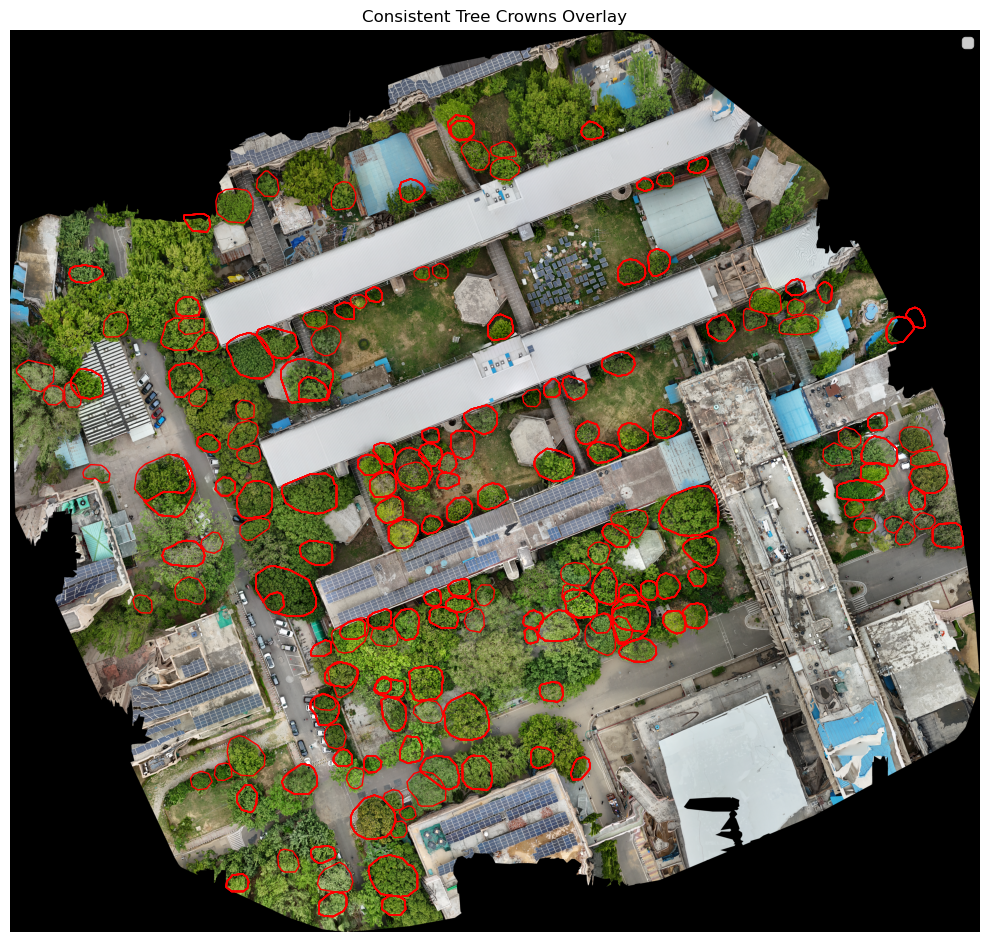

In [ ]:
import matplotlib.pyplot as plt
import geopandas as gpd
import rasterio
from rasterio.plot import show

# --- Paths ---
img_path = "large_files/sit_om5.tif"  # or change to sit_om4.tif etc. based on background
crowns_path = "tiles/final_consistent_om5.gpkg"

# --- Load crowns ---
crowns = gpd.read_file(crowns_path)

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 10))
with rasterio.open(img_path) as src:
    show(src, ax=ax)

crowns.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='Consistent Crowns')

ax.set_title("Consistent Tree Crowns Overlay")
plt.legend()
plt.axis('off')
plt.tight_layout()
plt.show()

